In [1]:
import geopandas as gpd

# Define the path to the shapefile
shapefile_path = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/dataset/asia/china/beijing.shp"

# Load the shapefile into a GeoDataFrame
gdf = gpd.read_file(shapefile_path)

# Display the first few rows of the data
print("Shapefile loaded successfully.")
print(gdf.head())

# Check the Coordinate Reference System (CRS)
print("\nCoordinate Reference System (CRS):")
print(gdf.crs)

# Check the column names and data types
print("\nColumns and Data Types:")
print(gdf.dtypes)

# Check the number of geometries and their types
print("\nNumber of records and geometry type:")
print(f"Total records: {len(gdf)}")
print(f"Geometry type: {gdf.geom_type.unique()}")

# Plot the geometries for a quick visualization
#gdf.plot(figsize=(10, 10), edgecolor="black")
#plt.title("Beijing Building Footprints")
#plt.show()


Shapefile loaded successfully.
    ID    Height                                           geometry
0  0.0  7.328740  POLYGON ((115.48294 39.65872, 115.48288 39.658...
1  1.0  5.289995  POLYGON ((115.48282 39.65533, 115.48277 39.655...
2  2.0  6.465960  POLYGON ((115.48305 39.65598, 115.48304 39.655...
3  3.0  7.233818  POLYGON ((115.48307 39.65556, 115.483 39.65555...
4  4.0  5.475875  POLYGON ((115.48321 39.6546, 115.48306 39.6545...

Coordinate Reference System (CRS):
EPSG:4326

Columns and Data Types:
ID           float64
Height       float64
geometry    geometry
dtype: object

Number of records and geometry type:
Total records: 2053802
Geometry type: ['Polygon' 'MultiPolygon']


In [2]:
print("Column names in the shapefile:")
print(gdf.columns)

Column names in the shapefile:
Index(['ID', 'Height', 'geometry'], dtype='object')


In [3]:
# Replace 'height' with the actual column name if found
if 'height' in gdf.columns:
    print("\nSummary of height values:")
    print(gdf['height'].describe())
else:
    print("\nNo 'height' column found. Please check other potential columns.")
    # Check data types of all columns
print("\nData types of the columns:")
print(gdf.dtypes)


# Display all column names
print("Columns in the shapefile:")
print(gdf.columns)

# Display the first few rows of data
print("\nSample data:")
print(gdf.head())



No 'height' column found. Please check other potential columns.

Data types of the columns:
ID           float64
Height       float64
geometry    geometry
dtype: object
Columns in the shapefile:
Index(['ID', 'Height', 'geometry'], dtype='object')

Sample data:
    ID    Height                                           geometry
0  0.0  7.328740  POLYGON ((115.48294 39.65872, 115.48288 39.658...
1  1.0  5.289995  POLYGON ((115.48282 39.65533, 115.48277 39.655...
2  2.0  6.465960  POLYGON ((115.48305 39.65598, 115.48304 39.655...
3  3.0  7.233818  POLYGON ((115.48307 39.65556, 115.483 39.65555...
4  4.0  5.475875  POLYGON ((115.48321 39.6546, 115.48306 39.6545...


In [4]:
print(gdf.crs)

EPSG:4326


In [ ]:
39.90514756777309, 116.40889692092686

Bounding Box: (116.39540256844066, 39.91465602876702, 116.40089573250316, 39.91886916175669)
Google Static Map saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/cn/google_map_image.png
Overlay saved to beijing_buildings_overlay.png


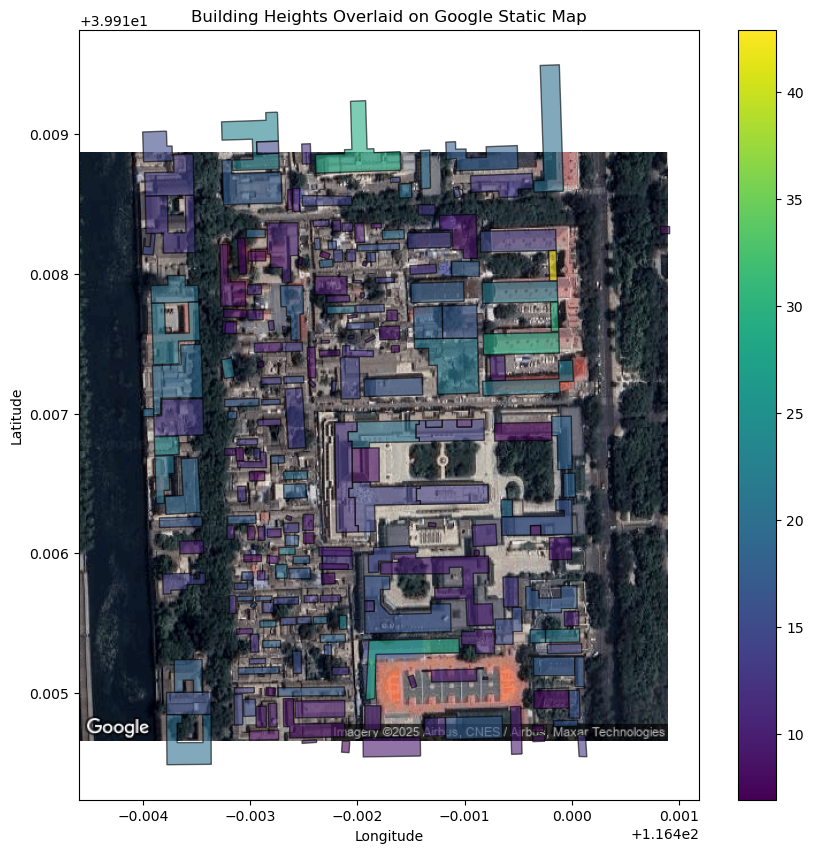

In [1]:
import geopandas as gpd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from shapely.geometry import box
import math


# Function to calculate bounding box
def get_bounding_box(lat, lon, zoom, size=512):
    EARTH_RADIUS = 6378137.0
    INITIAL_RESOLUTION = 2 * math.pi * EARTH_RADIUS / 256.0  # Resolution at zoom 0
    origin_shift = 2 * math.pi * EARTH_RADIUS / 2.0

    resolution = INITIAL_RESOLUTION / (2 ** zoom)

    mx = lon * origin_shift / 180.0
    my = math.log(math.tan((90 + lat) * math.pi / 360.0)) / (math.pi / 180.0)
    my = my * origin_shift / 180.0

    half_size = (size / 2.0) * resolution
    minx = mx - half_size
    maxx = mx + half_size
    miny = my - half_size
    maxy = my + half_size

    def meters_to_latlon(mx, my):
        lon = (mx / origin_shift) * 180.0
        lat = (my / origin_shift) * 180.0
        lat = 180 / math.pi * (2 * math.atan(math.exp(lat * math.pi / 180.0)) - math.pi / 2.0)
        return lat, lon

    min_lat, min_lon = meters_to_latlon(minx, miny)
    max_lat, max_lon = meters_to_latlon(maxx, maxy)

    return min_lon, min_lat, max_lon, max_lat


# Load your building data
def load_building_data(filepath):
    gdf = gpd.read_file(filepath)
    # Ensure CRS is WGS84 (EPSG:4326)
    if gdf.crs is None or gdf.crs.to_string() != "EPSG:4326":
        gdf = gdf.set_crs("EPSG:4326")
    return gdf


# Download Google Static Map
def download_and_crop_static_map(api_key, lat, lon, zoom, output_file, timeout=10, max_retries=3):
    base_url = "https://maps.googleapis.com/maps/api/staticmap"
    params = {
        "center": f"{lat},{lon}",
        "zoom": zoom,
        "size": "512x512",
        "maptype": "satellite",
        "key": api_key,
    }

    for attempt in range(max_retries):
        try:
            response = requests.get(base_url, params=params, timeout=timeout)
            if response.status_code == 200:
                image = Image.open(BytesIO(response.content))
                image.save(output_file)
                print(f"Google Static Map saved to {output_file}")
                return True
        except Exception as e:
            print(f"Error on attempt {attempt + 1}: {e}")
    print(f"Failed to download map after {max_retries} attempts.")
    return False


# Overlay Polygons with Heights
def plot_overlay(lat, lon, zoom, gdf, api_key, output_file):
    # Calculate bounding box
    bbox = get_bounding_box(lat, lon, zoom)
    min_lon, min_lat, max_lon, max_lat = bbox
    print(f"Bounding Box: {bbox}")

    # Filter buildings within the bounding box
    bbox_polygon = box(min_lon, min_lat, max_lon, max_lat)
    gdf_cropped = gdf[gdf.geometry.intersects(bbox_polygon)]

    # Download Google Static Map
    success = download_and_crop_static_map(api_key, lat, lon, zoom, output_file)
    if not success:
        return

    # Open the Google Map image
    google_map = Image.open(output_file)

    # Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(google_map, extent=(min_lon, max_lon, min_lat, max_lat), zorder=1)

    # Plot building footprints with height
    gdf_cropped.plot(
        ax=ax,
        column="Height",
        cmap="viridis",
        legend=True,
        alpha=0.6,
        edgecolor="black",
        zorder=2,
    )

    ax.set_title("Building Heights Overlaid on Google Static Map")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    # Save the overlay image
    combined_image_file = "beijing_buildings_overlay.png"
    plt.savefig(combined_image_file, dpi=300, bbox_inches="tight")
    print(f"Overlay saved to {combined_image_file}")
    plt.show()


# Parameters
lat, lon = 39.91676262766072, 116.39814915047191  # Beijing center coordinates
zoom = 17
api_key = # Replace with your API key
output_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/cn/google_map_image.png"

# Load building data and overlay
filepath = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/dataset/asia/china/beijing.shp"
gdf = load_building_data(filepath)
plot_overlay(lat, lon, zoom, gdf, api_key, output_file)


In [ ]:
/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/dataset/europe/switzerland/Switzerland.shp

Bounding Box: (8.500122045873699, 47.37836691391428, 8.505615209936199, 47.3820864998913)
Google Static Map saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/switzerland/google_map_image.png
Overlay saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/switzerland/buildings_overlay_grayscale.png


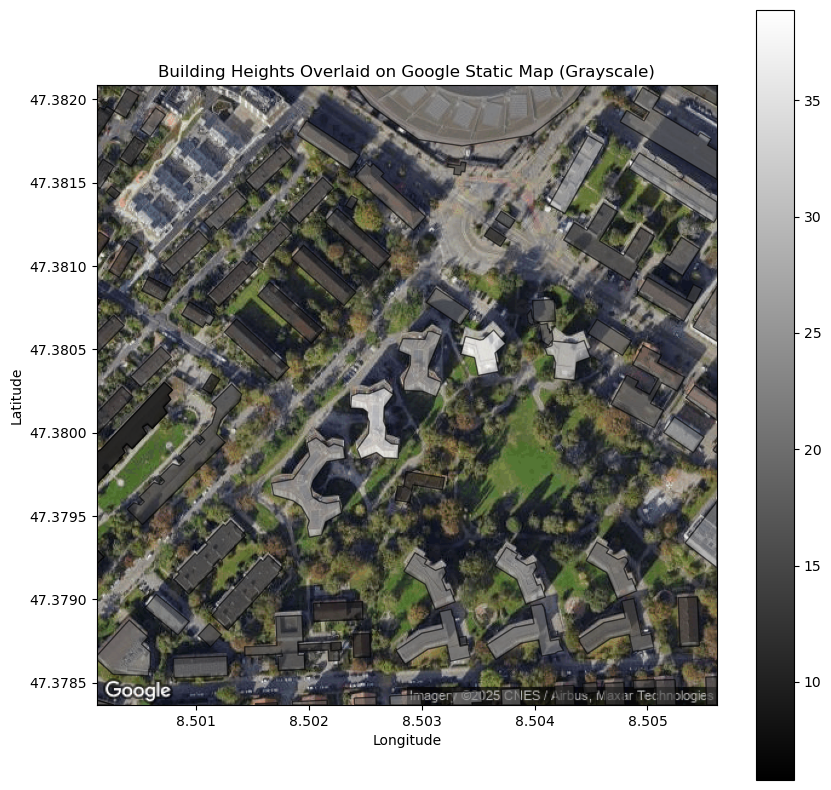

In [10]:
import geopandas as gpd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from shapely.geometry import box
import math


# Function to calculate bounding box
def get_bounding_box(lat, lon, zoom, size=512):
    EARTH_RADIUS = 6378137.0
    INITIAL_RESOLUTION = 2 * math.pi * EARTH_RADIUS / 256.0  # Resolution at zoom 0
    origin_shift = 2 * math.pi * EARTH_RADIUS / 2.0

    resolution = INITIAL_RESOLUTION / (2 ** zoom)

    mx = lon * origin_shift / 180.0
    my = math.log(math.tan((90 + lat) * math.pi / 360.0)) / (math.pi / 180.0)
    my = my * origin_shift / 180.0

    half_size = (size / 2.0) * resolution
    minx = mx - half_size
    maxx = mx + half_size
    miny = my - half_size
    maxy = my + half_size

    def meters_to_latlon(mx, my):
        lon = (mx / origin_shift) * 180.0
        lat = (my / origin_shift) * 180.0
        lat = 180 / math.pi * (2 * math.atan(math.exp(lat * math.pi / 180.0)) - math.pi / 2.0)
        return lat, lon

    min_lat, min_lon = meters_to_latlon(minx, miny)
    max_lat, max_lon = meters_to_latlon(maxx, maxy)

    return min_lon, min_lat, max_lon, max_lat


# Load your building data
def load_building_data(filepath):
    gdf = gpd.read_file(filepath)
    # Ensure CRS is WGS84 (EPSG:4326)
    if gdf.crs is None or gdf.crs.to_string() != "EPSG:4326":
        gdf = gdf.set_crs("EPSG:4326")
    return gdf


# Download Google Static Map
def download_and_crop_static_map(api_key, lat, lon, zoom, output_file, timeout=10, max_retries=3):
    base_url = "https://maps.googleapis.com/maps/api/staticmap"
    params = {
        "center": f"{lat},{lon}",
        "zoom": zoom,
        "size": "512x512",
        "maptype": "satellite",
        "key": api_key,
    }

    for attempt in range(max_retries):
        try:
            response = requests.get(base_url, params=params, timeout=timeout)
            if response.status_code == 200:
                image = Image.open(BytesIO(response.content))
                image.save(output_file)
                print(f"Google Static Map saved to {output_file}")
                return True
        except Exception as e:
            print(f"Error on attempt {attempt + 1}: {e}")
    print(f"Failed to download map after {max_retries} attempts.")
    return False


# Overlay Polygons with Heights in Grayscale
def plot_overlay(lat, lon, zoom, gdf, api_key, output_file):
    # Calculate bounding box
    bbox = get_bounding_box(lat, lon, zoom)
    min_lon, min_lat, max_lon, max_lat = bbox
    print(f"Bounding Box: {bbox}")

    # Create a bounding box polygon
    bbox_polygon = box(min_lon, min_lat, max_lon, max_lat)

    # Filter buildings strictly within the bounding box
    gdf_cropped = gpd.clip(gdf, gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326"))

    # Download Google Static Map
    success = download_and_crop_static_map(api_key, lat, lon, zoom, output_file)
    if not success:
        return

    # Open the Google Map image
    google_map = Image.open(output_file)

    # Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(google_map, extent=(min_lon, max_lon, min_lat, max_lat), zorder=1)

    # Plot building footprints with height in grayscale
    gdf_cropped.plot(
        ax=ax,
        column="Height",
        cmap="gray",
        legend=True,
        alpha=0.6,
        edgecolor="black",
        zorder=2,
    )

    ax.set_title("Building Heights Overlaid on Google Static Map (Grayscale)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    # Save the overlay image
    combined_image_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/switzerland/buildings_overlay_grayscale.png"
    plt.savefig(combined_image_file, dpi=300, bbox_inches="tight")
    print(f"Overlay saved to {combined_image_file}")
    plt.show()


# Parameters
lat, lon = 47.380226739704895, 8.502868627904947  # ZURICH EXAMPLE coordinates
zoom = 17
api_key =   # Replace with your API key
output_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/switzerland/google_map_image.png"

# Load building data and overlay
filepath = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/dataset/europe/switzerland/Switzerland.shp"
gdf = load_building_data(filepath)
plot_overlay(lat, lon, zoom, gdf, api_key, output_file)


# UK

In [2]:
pip install rarfile

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import geopandas as gpd

def load_building_data(filepath):
    gdf = gpd.read_file(filepath)  # GeoJSON is supported
    # Ensure CRS is WGS84 (EPSG:4326)
    if gdf.crs is None or gdf.crs.to_string() != "EPSG:4326":
        gdf = gdf.to_crs("EPSG:4326")
    return gdf
def plot_overlay(lat, lon, zoom, gdf, api_key, output_file):
    # Calculate bounding box
    bbox = get_bounding_box(lat, lon, zoom)
    min_lon, min_lat, max_lon, max_lat = bbox
    print(f"Bounding Box: {bbox}")

    # Create bounding box polygon
    bbox_polygon = box(min_lon, min_lat, max_lon, max_lat)

    # Clip buildings to the bounding box
    gdf_cropped = gpd.clip(gdf, gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326"))

    # Debug: Check cropped GeoDataFrame
    if gdf_cropped.empty:
        print("No building footprints found within the bounding box.")
        return
    print(f"Number of buildings in cropped area: {len(gdf_cropped)}")


    # Download Google Static Map
    success = download_and_crop_static_map(api_key, lat, lon, zoom, output_file)
    if not success:
        return

    # Open Google Map image
    google_map = Image.open(output_file)

    # Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(google_map, extent=(min_lon, max_lon, min_lat, max_lat), zorder=1)

    # Add bounding box rectangle
    from matplotlib.patches import Rectangle
    rect = Rectangle((min_lon, min_lat), max_lon - min_lon, max_lat - min_lat,
                     linewidth=2, edgecolor='red', facecolor='none', zorder=3)
    ax.add_patch(rect)

    # Plot building footprints with height in grayscale
    gdf_cropped.plot(
        ax=ax,
        column="pre_heigh",
        cmap="gray",
        legend=True,
        alpha=0.6,
        edgecolor="black",
        zorder=2,
    )

    ax.set_title("Building Heights Overlaid on Google Static Map (Grayscale)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    # Save the overlay image
    combined_image_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/uk/buildings_overlay_grayscale.png"
    plt.savefig(combined_image_file, dpi=300, bbox_inches="tight")
    print(f"Overlay saved to {combined_image_file}")
    plt.show()

# Parameters
lat, lon = 51.48210658285678, -0.19386476311346104  # Example center coordinates
zoom = 17
api_key = 
output_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/uk/google_map_image.png"

# Load GeoJSON data
filepath = "/Users/wangzhuoyulucas/SMART /europe/uk_new/new shape/uk.shp"
gdf = load_building_data(filepath)

# Plot overlay with Google Static Map
plot_overlay(lat, lon, zoom, gdf, api_key, output_file)

Bounding Box: (-0.19661134514471104, 51.480396092062165, -0.19111818108221107, 51.48381700949806)
Number of buildings in cropped area: 55
Google Static Map saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/uk/google_map_image.png
Overlay saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/uk/buildings_overlay_grayscale.png


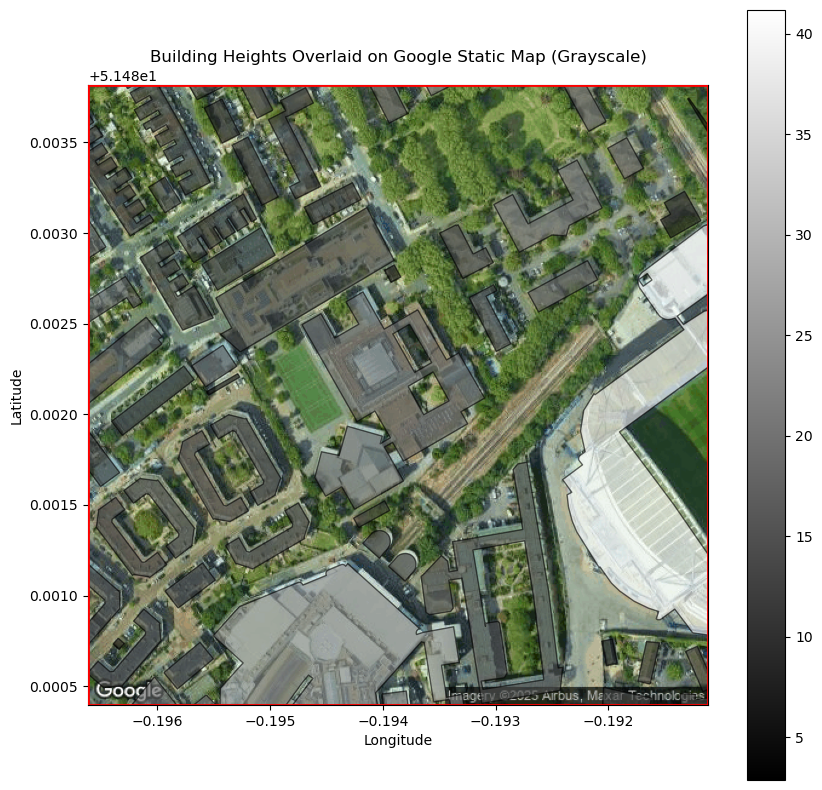

In [34]:
lat, lon = 51.48210658285678, -0.19386476311346104 # LONDON EXMAPLE coordinates
zoom = 17
api_key =  # Replace with your API key
output_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/uk/google_map_image.png"

# Load building data and overlay
filepath = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/dataset/europe/uk_new/new shape/uk.shp"

plot_overlay(lat, lon, zoom, gdf, api_key, output_file)

# JAPAN

Bounding Box: (139.3073120266234, 35.775083322390294, 139.3128051906859, 35.779539901074315)
Google Static Map saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/japan/google_map_image.png
Overlay saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/japan/buildings_overlay_grayscale.png


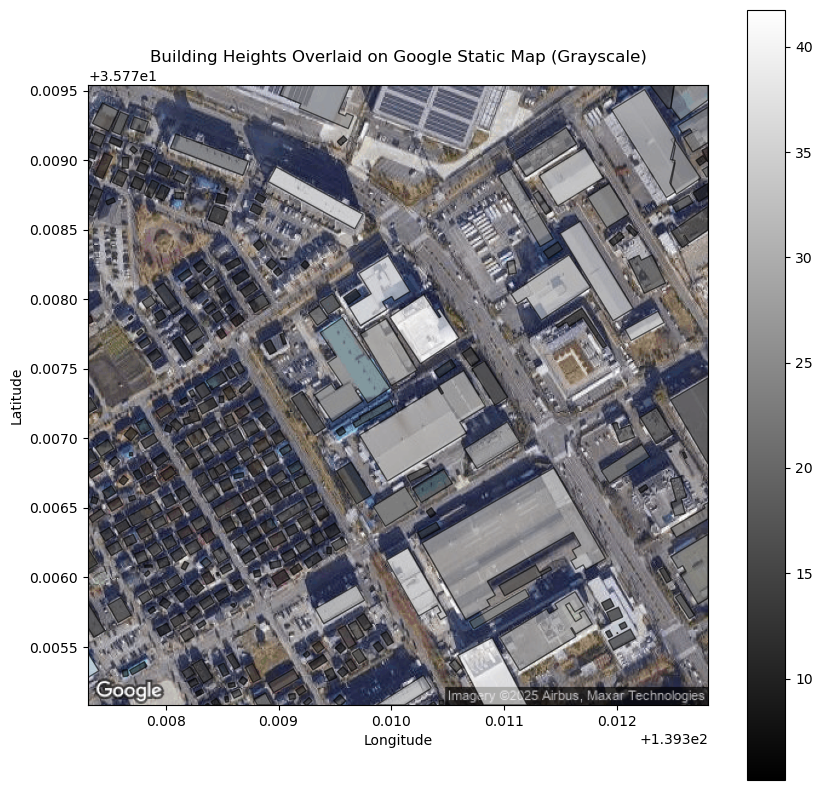

In [1]:
import geopandas as gpd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from shapely.geometry import box
import math


# Function to calculate bounding box
def get_bounding_box(lat, lon, zoom, size=512):
    EARTH_RADIUS = 6378137.0
    INITIAL_RESOLUTION = 2 * math.pi * EARTH_RADIUS / 256.0  # Resolution at zoom 0
    origin_shift = 2 * math.pi * EARTH_RADIUS / 2.0

    resolution = INITIAL_RESOLUTION / (2 ** zoom)

    mx = lon * origin_shift / 180.0
    my = math.log(math.tan((90 + lat) * math.pi / 360.0)) / (math.pi / 180.0)
    my = my * origin_shift / 180.0

    half_size = (size / 2.0) * resolution
    minx = mx - half_size
    maxx = mx + half_size
    miny = my - half_size
    maxy = my + half_size

    def meters_to_latlon(mx, my):
        lon = (mx / origin_shift) * 180.0
        lat = (my / origin_shift) * 180.0
        lat = 180 / math.pi * (2 * math.atan(math.exp(lat * math.pi / 180.0)) - math.pi / 2.0)
        return lat, lon

    min_lat, min_lon = meters_to_latlon(minx, miny)
    max_lat, max_lon = meters_to_latlon(maxx, maxy)

    return min_lon, min_lat, max_lon, max_lat


# Load your building data
def load_building_data(filepath):
    gdf = gpd.read_file(filepath)
    # Ensure CRS is WGS84 (EPSG:4326)
    if gdf.crs is None or gdf.crs.to_string() != "EPSG:4326":
        gdf = gdf.set_crs("EPSG:4326")
    return gdf


# Download Google Static Map
def download_and_crop_static_map(api_key, lat, lon, zoom, output_file, timeout=10, max_retries=3):
    base_url = "https://maps.googleapis.com/maps/api/staticmap"
    params = {
        "center": f"{lat},{lon}",
        "zoom": zoom,
        "size": "512x512",
        "maptype": "satellite",
        "key": api_key,
    }

    for attempt in range(max_retries):
        try:
            response = requests.get(base_url, params=params, timeout=timeout)
            if response.status_code == 200:
                image = Image.open(BytesIO(response.content))
                image.save(output_file)
                print(f"Google Static Map saved to {output_file}")
                return True
        except Exception as e:
            print(f"Error on attempt {attempt + 1}: {e}")
    print(f"Failed to download map after {max_retries} attempts.")
    return False


# Overlay Polygons with Heights in Grayscale
def plot_overlay(lat, lon, zoom, gdf, api_key, output_file):
    # Calculate bounding box
    bbox = get_bounding_box(lat, lon, zoom)
    min_lon, min_lat, max_lon, max_lat = bbox
    print(f"Bounding Box: {bbox}")

    # Create a bounding box polygon
    bbox_polygon = box(min_lon, min_lat, max_lon, max_lat)

    # Filter buildings strictly within the bounding box
    gdf_cropped = gpd.clip(gdf, gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326"))

    # Download Google Static Map
    success = download_and_crop_static_map(api_key, lat, lon, zoom, output_file)
    if not success:
        return

    # Open the Google Map image
    google_map = Image.open(output_file)

    # Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(google_map, extent=(min_lon, max_lon, min_lat, max_lat), zorder=1)

    # Plot building footprints with height in grayscale
    gdf_cropped.plot(
        ax=ax,
        column="Height",
        cmap="gray",
        legend=True,
        alpha=0.6,
        edgecolor="black",
        zorder=2,
    )

    ax.set_title("Building Heights Overlaid on Google Static Map (Grayscale)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    # Save the overlay image
    combined_image_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/japan/buildings_overlay_grayscale.png"
    plt.savefig(combined_image_file, dpi=300, bbox_inches="tight")
    print(f"Overlay saved to {combined_image_file}")
    plt.show()


# Parameters
lat, lon = 35.77731164295693, 139.31005860865463 # TOKYO EXMAPLE coordinates
zoom = 17
api_key =   # Replace with your API key
output_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/japan/google_map_image.png"

# Load building data and overlay
filepath = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/dataset/asia/japan/Japan/Japan.shp"
gdf = load_building_data(filepath)
plot_overlay(lat, lon, zoom, gdf, api_key, output_file)


# SOUTH KOREA

Bounding Box: (126.98789589384596, 37.56314789855406, 126.99338905790843, 37.56750210313177)
Google Static Map saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/korea/google_map_image.png
Overlay saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/korea/buildings_overlay_grayscale.png


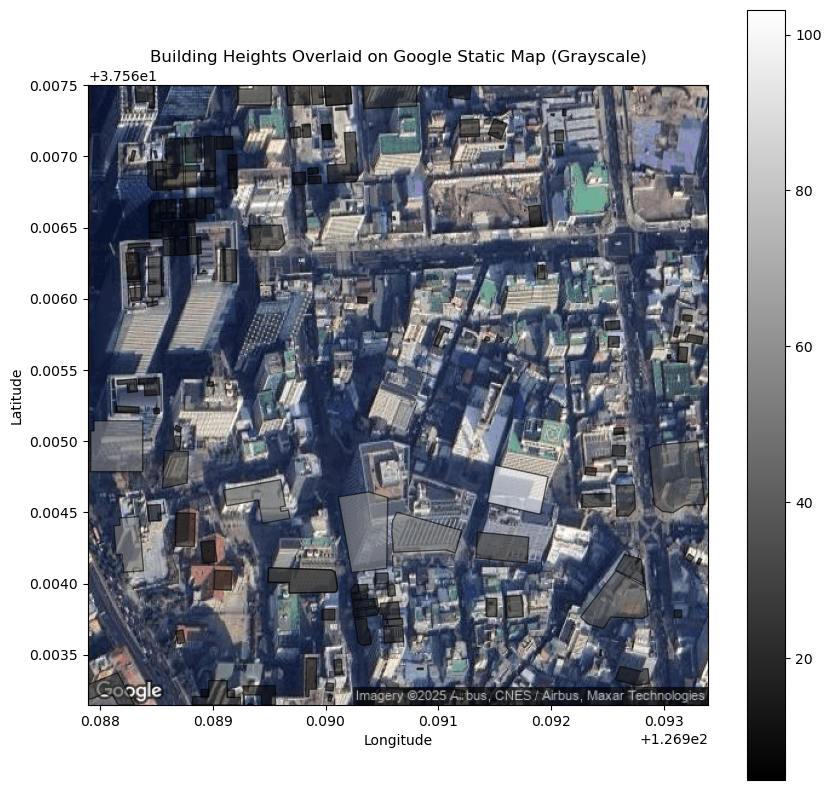

In [2]:
import geopandas as gpd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from shapely.geometry import box
import math


# Function to calculate bounding box
def get_bounding_box(lat, lon, zoom, size=512):
    EARTH_RADIUS = 6378137.0
    INITIAL_RESOLUTION = 2 * math.pi * EARTH_RADIUS / 256.0  # Resolution at zoom 0
    origin_shift = 2 * math.pi * EARTH_RADIUS / 2.0

    resolution = INITIAL_RESOLUTION / (2 ** zoom)

    mx = lon * origin_shift / 180.0
    my = math.log(math.tan((90 + lat) * math.pi / 360.0)) / (math.pi / 180.0)
    my = my * origin_shift / 180.0

    half_size = (size / 2.0) * resolution
    minx = mx - half_size
    maxx = mx + half_size
    miny = my - half_size
    maxy = my + half_size

    def meters_to_latlon(mx, my):
        lon = (mx / origin_shift) * 180.0
        lat = (my / origin_shift) * 180.0
        lat = 180 / math.pi * (2 * math.atan(math.exp(lat * math.pi / 180.0)) - math.pi / 2.0)
        return lat, lon

    min_lat, min_lon = meters_to_latlon(minx, miny)
    max_lat, max_lon = meters_to_latlon(maxx, maxy)

    return min_lon, min_lat, max_lon, max_lat


# Load your building data
def load_building_data(filepath):
    gdf = gpd.read_file(filepath)
    # Ensure CRS is WGS84 (EPSG:4326)
    if gdf.crs is None or gdf.crs.to_string() != "EPSG:4326":
        gdf = gdf.set_crs("EPSG:4326")
    return gdf


# Download Google Static Map
def download_and_crop_static_map(api_key, lat, lon, zoom, output_file, timeout=10, max_retries=3):
    base_url = "https://maps.googleapis.com/maps/api/staticmap"
    params = {
        "center": f"{lat},{lon}",
        "zoom": zoom,
        "size": "512x512",
        "maptype": "satellite",
        "key": api_key,
    }

    for attempt in range(max_retries):
        try:
            response = requests.get(base_url, params=params, timeout=timeout)
            if response.status_code == 200:
                image = Image.open(BytesIO(response.content))
                image.save(output_file)
                print(f"Google Static Map saved to {output_file}")
                return True
        except Exception as e:
            print(f"Error on attempt {attempt + 1}: {e}")
    print(f"Failed to download map after {max_retries} attempts.")
    return False


# Overlay Polygons with Heights in Grayscale
def plot_overlay(lat, lon, zoom, gdf, api_key, output_file):
    # Calculate bounding box
    bbox = get_bounding_box(lat, lon, zoom)
    min_lon, min_lat, max_lon, max_lat = bbox
    print(f"Bounding Box: {bbox}")

    # Create a bounding box polygon
    bbox_polygon = box(min_lon, min_lat, max_lon, max_lat)

    # Filter buildings strictly within the bounding box
    gdf_cropped = gpd.clip(gdf, gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326"))

    # Download Google Static Map
    success = download_and_crop_static_map(api_key, lat, lon, zoom, output_file)
    if not success:
        return

    # Open the Google Map image
    google_map = Image.open(output_file)

    # Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(google_map, extent=(min_lon, max_lon, min_lat, max_lat), zorder=1)

    # Plot building footprints with height in grayscale
    gdf_cropped.plot(
        ax=ax,
        column="Height",
        cmap="gray",
        legend=True,
        alpha=0.6,
        edgecolor="black",
        zorder=2,
    )

    ax.set_title("Building Heights Overlaid on Google Static Map (Grayscale)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    # Save the overlay image
    combined_image_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/korea/buildings_overlay_grayscale.png"
    plt.savefig(combined_image_file, dpi=300, bbox_inches="tight")
    print(f"Overlay saved to {combined_image_file}")
    plt.show()


# Parameters
lat, lon = 37.565325032656354, 126.9906424758772 # souel EXMAPLE 1 coordinates
zoom = 17
api_key =   # Replace with your API key
output_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/korea/google_map_image.png"

# Load building data and overlay
filepath = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/dataset/asia/south korea/South_Korea/South_Korea.shp"
gdf = load_building_data(filepath)
plot_overlay(lat, lon, zoom, gdf, api_key, output_file)


Bounding Box: (126.78043726420499, 37.60449312783996, 126.78593042826748, 37.60884491468685)
Google Static Map saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/korea/google_map_image.png
Overlay saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/korea/buildings_overlay_grayscale.png


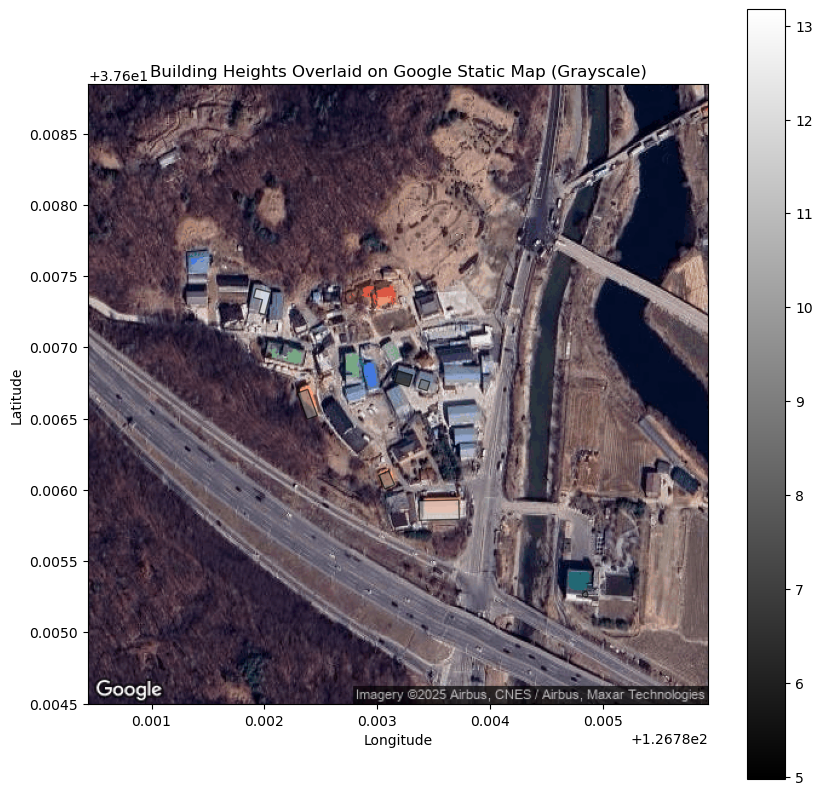

In [3]:
import geopandas as gpd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from shapely.geometry import box
import math


# Function to calculate bounding box
def get_bounding_box(lat, lon, zoom, size=512):
    EARTH_RADIUS = 6378137.0
    INITIAL_RESOLUTION = 2 * math.pi * EARTH_RADIUS / 256.0  # Resolution at zoom 0
    origin_shift = 2 * math.pi * EARTH_RADIUS / 2.0

    resolution = INITIAL_RESOLUTION / (2 ** zoom)

    mx = lon * origin_shift / 180.0
    my = math.log(math.tan((90 + lat) * math.pi / 360.0)) / (math.pi / 180.0)
    my = my * origin_shift / 180.0

    half_size = (size / 2.0) * resolution
    minx = mx - half_size
    maxx = mx + half_size
    miny = my - half_size
    maxy = my + half_size

    def meters_to_latlon(mx, my):
        lon = (mx / origin_shift) * 180.0
        lat = (my / origin_shift) * 180.0
        lat = 180 / math.pi * (2 * math.atan(math.exp(lat * math.pi / 180.0)) - math.pi / 2.0)
        return lat, lon

    min_lat, min_lon = meters_to_latlon(minx, miny)
    max_lat, max_lon = meters_to_latlon(maxx, maxy)

    return min_lon, min_lat, max_lon, max_lat


# Load your building data
def load_building_data(filepath):
    gdf = gpd.read_file(filepath)
    # Ensure CRS is WGS84 (EPSG:4326)
    if gdf.crs is None or gdf.crs.to_string() != "EPSG:4326":
        gdf = gdf.set_crs("EPSG:4326")
    return gdf


# Download Google Static Map
def download_and_crop_static_map(api_key, lat, lon, zoom, output_file, timeout=10, max_retries=3):
    base_url = "https://maps.googleapis.com/maps/api/staticmap"
    params = {
        "center": f"{lat},{lon}",
        "zoom": zoom,
        "size": "512x512",
        "maptype": "satellite",
        "key": api_key,
    }

    for attempt in range(max_retries):
        try:
            response = requests.get(base_url, params=params, timeout=timeout)
            if response.status_code == 200:
                image = Image.open(BytesIO(response.content))
                image.save(output_file)
                print(f"Google Static Map saved to {output_file}")
                return True
        except Exception as e:
            print(f"Error on attempt {attempt + 1}: {e}")
    print(f"Failed to download map after {max_retries} attempts.")
    return False


# Overlay Polygons with Heights in Grayscale
def plot_overlay(lat, lon, zoom, gdf, api_key, output_file):
    # Calculate bounding box
    bbox = get_bounding_box(lat, lon, zoom)
    min_lon, min_lat, max_lon, max_lat = bbox
    print(f"Bounding Box: {bbox}")

    # Create a bounding box polygon
    bbox_polygon = box(min_lon, min_lat, max_lon, max_lat)

    # Filter buildings strictly within the bounding box
    gdf_cropped = gpd.clip(gdf, gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326"))

    # Download Google Static Map
    success = download_and_crop_static_map(api_key, lat, lon, zoom, output_file)
    if not success:
        return

    # Open the Google Map image
    google_map = Image.open(output_file)

    # Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(google_map, extent=(min_lon, max_lon, min_lat, max_lat), zorder=1)

    # Plot building footprints with height in grayscale
    gdf_cropped.plot(
        ax=ax,
        column="Height",
        cmap="gray",
        legend=True,
        alpha=0.6,
        edgecolor="black",
        zorder=2,
    )

    ax.set_title("Building Heights Overlaid on Google Static Map (Grayscale)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    # Save the overlay image
    combined_image_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/korea/buildings_overlay_grayscale.png"
    plt.savefig(combined_image_file, dpi=300, bbox_inches="tight")
    print(f"Overlay saved to {combined_image_file}")
    plt.show()


# Parameters
lat, lon = 37.60666905308899, 126.78318384623623 # SOUEL EXMAPLE coordinates
zoom = 17
api_key = # Replace with your API key
output_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/korea/google_map_image.png"

# Load building data and overlay
filepath = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/dataset/asia/south korea/South_Korea/South_Korea.shp"
gdf = load_building_data(filepath)
plot_overlay(lat, lon, zoom, gdf, api_key, output_file)


# EXAMPLE lat and long

In [ ]:
City	Country	Latitude	Longitude
Orlando	United States	28.538336	-81.379234
Chicago	United States	41.878113	-87.629799
New York	United States	40.712776	-74.005974
Zurich	Switzerland	47.376887	8.541694
London	United Kingdom	51.507351	-0.127758
Singapore	Singapore	1.352083	103.819839
Delhi	India	28.613939	77.209023
Hong Kong	China	22.319303	114.169361
Kigali	Rwanda	-1.970579	30.104429
Kinshasa	Congo (DRC)	-4.441931	15.266293
Sao Paulo	Brazil	-23.550520	-46.633308
Canberra	Australia	-35.280937	149.130009


# HONG KONG 

Bounding Box: (114.16429750153698, 22.323519962243264, 114.16979066559948, 22.328601342406635)
Google Static Map saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/HK/google_map_image2.png
Overlay saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/HK/buildings_overlay_grayscale2.png


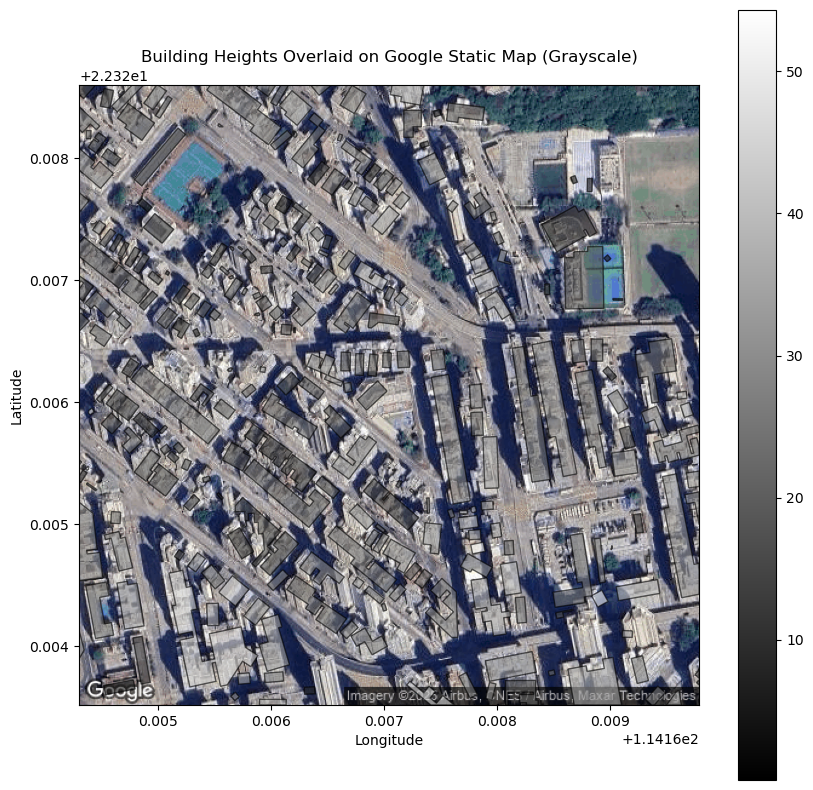

In [36]:
import geopandas as gpd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from shapely.geometry import box
import math


# Function to calculate bounding box
def get_bounding_box(lat, lon, zoom, size=512):
    EARTH_RADIUS = 6378137.0
    INITIAL_RESOLUTION = 2 * math.pi * EARTH_RADIUS / 256.0  # Resolution at zoom 0
    origin_shift = 2 * math.pi * EARTH_RADIUS / 2.0

    resolution = INITIAL_RESOLUTION / (2 ** zoom)

    mx = lon * origin_shift / 180.0
    my = math.log(math.tan((90 + lat) * math.pi / 360.0)) / (math.pi / 180.0)
    my = my * origin_shift / 180.0

    half_size = (size / 2.0) * resolution
    minx = mx - half_size
    maxx = mx + half_size
    miny = my - half_size
    maxy = my + half_size

    def meters_to_latlon(mx, my):
        lon = (mx / origin_shift) * 180.0
        lat = (my / origin_shift) * 180.0
        lat = 180 / math.pi * (2 * math.atan(math.exp(lat * math.pi / 180.0)) - math.pi / 2.0)
        return lat, lon

    min_lat, min_lon = meters_to_latlon(minx, miny)
    max_lat, max_lon = meters_to_latlon(maxx, maxy)

    return min_lon, min_lat, max_lon, max_lat


# Load your building data
def load_building_data(filepath):
    gdf = gpd.read_file(filepath)
    # Ensure CRS is WGS84 (EPSG:4326)
    if gdf.crs is None or gdf.crs.to_string() != "EPSG:4326":
        gdf = gdf.set_crs("EPSG:4326")
    return gdf


# Download Google Static Map
def download_and_crop_static_map(api_key, lat, lon, zoom, output_file, timeout=10, max_retries=3):
    base_url = "https://maps.googleapis.com/maps/api/staticmap"
    params = {
        "center": f"{lat},{lon}",
        "zoom": zoom,
        "size": "512x512",
        "maptype": "satellite",
        "key": api_key,
    }

    for attempt in range(max_retries):
        try:
            response = requests.get(base_url, params=params, timeout=timeout)
            if response.status_code == 200:
                image = Image.open(BytesIO(response.content))
                image.save(output_file)
                print(f"Google Static Map saved to {output_file}")
                return True
        except Exception as e:
            print(f"Error on attempt {attempt + 1}: {e}")
    print(f"Failed to download map after {max_retries} attempts.")
    return False


# Overlay Polygons with Heights in Grayscale
def plot_overlay(lat, lon, zoom, gdf, api_key, output_file):
    # Calculate bounding box
    bbox = get_bounding_box(lat, lon, zoom)
    min_lon, min_lat, max_lon, max_lat = bbox
    print(f"Bounding Box: {bbox}")

    # Create a bounding box polygon
    bbox_polygon = box(min_lon, min_lat, max_lon, max_lat)

    # Filter buildings strictly within the bounding box
    gdf_cropped = gpd.clip(gdf, gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326"))

    # Download Google Static Map
    success = download_and_crop_static_map(api_key, lat, lon, zoom, output_file)
    if not success:
        return

    # Open the Google Map image
    google_map = Image.open(output_file)

    # Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(google_map, extent=(min_lon, max_lon, min_lat, max_lat), zorder=1)

    # Plot building footprints with height in grayscale
    gdf_cropped.plot(
        ax=ax,
        column="Height",
        cmap="gray",
        legend=True,
        alpha=0.6,
        edgecolor="black",
        zorder=2,
    )

    ax.set_title("Building Heights Overlaid on Google Static Map (Grayscale)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    # Save the overlay image
    combined_image_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/HK/buildings_overlay_grayscale2.png"
    plt.savefig(combined_image_file, dpi=300, bbox_inches="tight")
    print(f"Overlay saved to {combined_image_file}")
    plt.show()


# Parameters
lat, lon = 22.32606067545809, 114.16704408356823 #22.324778741038248, 114.16878926337498 # HK EXMAPLE 1 coordinates
zoom = 17
api_key =  # Replace with your API key
output_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/HK/google_map_image2.png"

# Load building data and overlay
filepath = "/Users/wangzhuoyulucas/SMART /asia/china/China_2/HK_Macau.shp"
gdf = load_building_data(filepath)
plot_overlay(lat, lon, zoom, gdf, api_key, output_file)


# AUSTRALIA -35.3081155796913, 149.1243407965461

Bounding Box: (149.12159421451486, -35.31035691265131, 149.12708737857736, -35.305874184631485)
Google Static Map saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/australia/google_map_image2.png
Overlay saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/australia/buildings_overlay_grayscale2.png


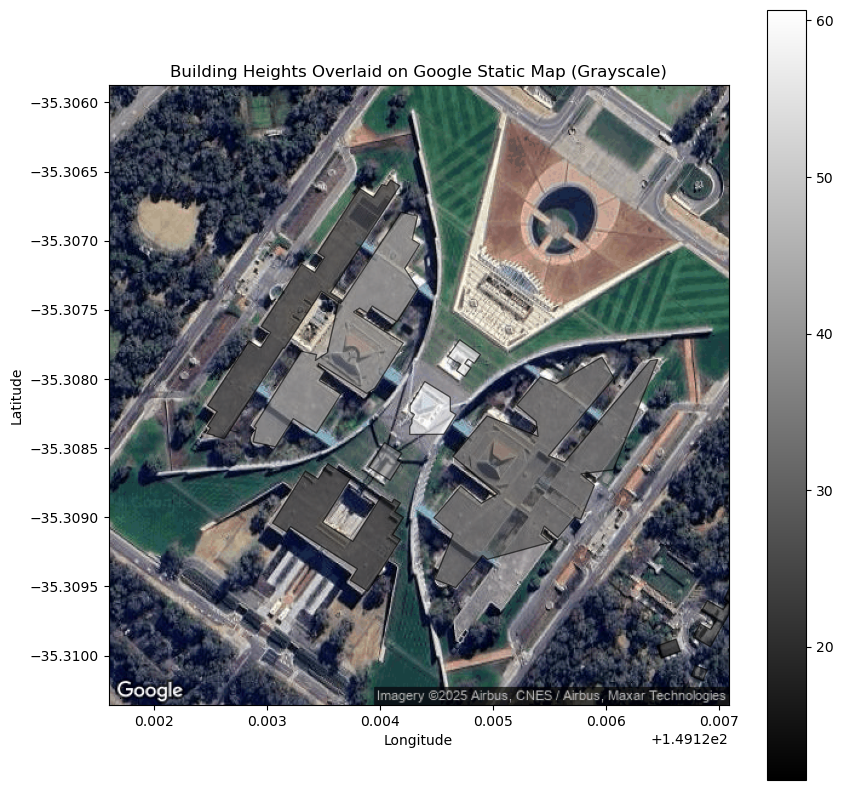

In [38]:


import geopandas as gpd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from shapely.geometry import box
import math


# Function to calculate bounding box
def get_bounding_box(lat, lon, zoom, size=512):
    EARTH_RADIUS = 6378137.0
    INITIAL_RESOLUTION = 2 * math.pi * EARTH_RADIUS / 256.0  # Resolution at zoom 0
    origin_shift = 2 * math.pi * EARTH_RADIUS / 2.0

    resolution = INITIAL_RESOLUTION / (2 ** zoom)

    mx = lon * origin_shift / 180.0
    my = math.log(math.tan((90 + lat) * math.pi / 360.0)) / (math.pi / 180.0)
    my = my * origin_shift / 180.0

    half_size = (size / 2.0) * resolution
    minx = mx - half_size
    maxx = mx + half_size
    miny = my - half_size
    maxy = my + half_size

    def meters_to_latlon(mx, my):
        lon = (mx / origin_shift) * 180.0
        lat = (my / origin_shift) * 180.0
        lat = 180 / math.pi * (2 * math.atan(math.exp(lat * math.pi / 180.0)) - math.pi / 2.0)
        return lat, lon

    min_lat, min_lon = meters_to_latlon(minx, miny)
    max_lat, max_lon = meters_to_latlon(maxx, maxy)

    return min_lon, min_lat, max_lon, max_lat


# Load your building data
def load_building_data(filepath):
    gdf = gpd.read_file(filepath)
    # Ensure CRS is WGS84 (EPSG:4326)
    if gdf.crs is None or gdf.crs.to_string() != "EPSG:4326":
        gdf = gdf.set_crs("EPSG:4326")
    return gdf


# Download Google Static Map
def download_and_crop_static_map(api_key, lat, lon, zoom, output_file, timeout=10, max_retries=3):
    base_url = "https://maps.googleapis.com/maps/api/staticmap"
    params = {
        "center": f"{lat},{lon}",
        "zoom": zoom,
        "size": "512x512",
        "maptype": "satellite",
        "key": api_key,
    }

    for attempt in range(max_retries):
        try:
            response = requests.get(base_url, params=params, timeout=timeout)
            if response.status_code == 200:
                image = Image.open(BytesIO(response.content))
                image.save(output_file)
                print(f"Google Static Map saved to {output_file}")
                return True
        except Exception as e:
            print(f"Error on attempt {attempt + 1}: {e}")
    print(f"Failed to download map after {max_retries} attempts.")
    return False


# Overlay Polygons with Heights in Grayscale
def plot_overlay(lat, lon, zoom, gdf, api_key, output_file):
    # Calculate bounding box
    bbox = get_bounding_box(lat, lon, zoom)
    min_lon, min_lat, max_lon, max_lat = bbox
    print(f"Bounding Box: {bbox}")

    # Create a bounding box polygon
    bbox_polygon = box(min_lon, min_lat, max_lon, max_lat)

    # Filter buildings strictly within the bounding box
    gdf_cropped = gpd.clip(gdf, gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326"))

    # Download Google Static Map
    success = download_and_crop_static_map(api_key, lat, lon, zoom, output_file)
    if not success:
        return

    # Open the Google Map image
    google_map = Image.open(output_file)

    # Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(google_map, extent=(min_lon, max_lon, min_lat, max_lat), zorder=1)

    # Plot building footprints with height in grayscale
    gdf_cropped.plot(
        ax=ax,
        column="Height",
        cmap="gray",
        legend=True,
        alpha=0.6,
        edgecolor="black",
        zorder=2,
    )

    ax.set_title("Building Heights Overlaid on Google Static Map (Grayscale)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    # Save the overlay image
    combined_image_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/australia/buildings_overlay_grayscale2.png"
    plt.savefig(combined_image_file, dpi=300, bbox_inches="tight")
    print(f"Overlay saved to {combined_image_file}")
    plt.show()


# Parameters
lat, lon = -35.3081155796913, 149.1243407965461 # australia EXMAPLE 1 coordinates
zoom = 17
api_key =  # Replace with your API key
output_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/australia/google_map_image2.png"

# Load building data and overlay
filepath = "/Users/wangzhuoyulucas/SMART /australia/Oceania/Australia.shp"
gdf = load_building_data(filepath)
plot_overlay(lat, lon, zoom, gdf, api_key, output_file)



# SAO PAULO BRAZIL

Bounding Box: (-46.667966996186635, -23.608179188704135, -46.665220414155385, -23.605662456136557)
Google Static Map saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/brazil/google_map_image2.png
Overlay saved to /Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/brazil/buildings_overlay_grayscale2.png


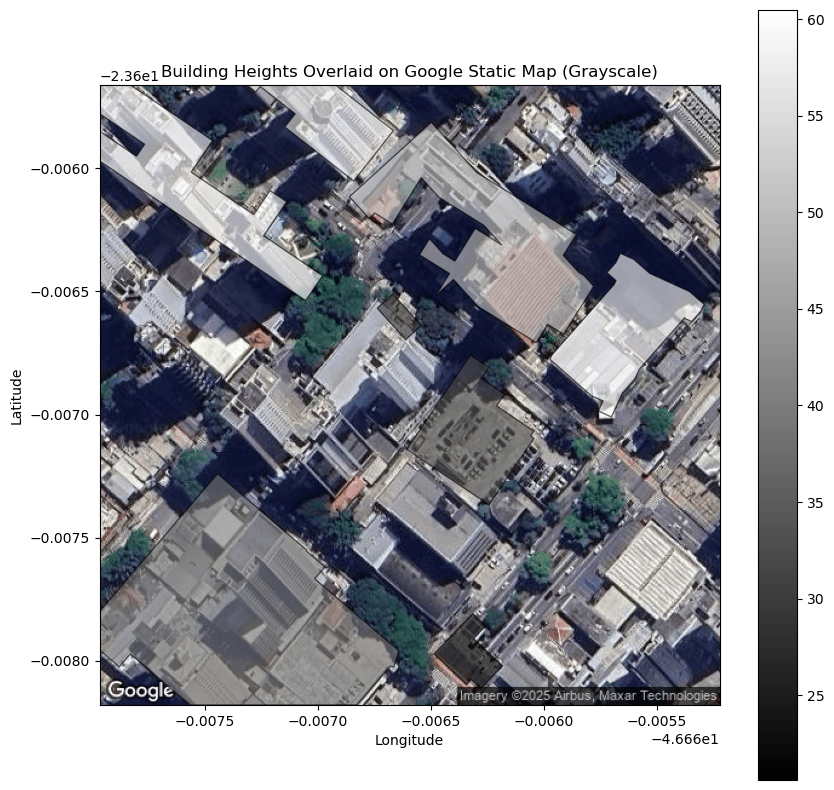

In [2]:

import geopandas as gpd
import requests
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
from shapely.geometry import box
import math


# Function to calculate bounding box
def get_bounding_box(lat, lon, zoom, size=512):
    EARTH_RADIUS = 6378137.0
    INITIAL_RESOLUTION = 2 * math.pi * EARTH_RADIUS / 256.0  # Resolution at zoom 0
    origin_shift = 2 * math.pi * EARTH_RADIUS / 2.0

    resolution = INITIAL_RESOLUTION / (2 ** zoom)

    mx = lon * origin_shift / 180.0
    my = math.log(math.tan((90 + lat) * math.pi / 360.0)) / (math.pi / 180.0)
    my = my * origin_shift / 180.0

    half_size = (size / 2.0) * resolution
    minx = mx - half_size
    maxx = mx + half_size
    miny = my - half_size
    maxy = my + half_size

    def meters_to_latlon(mx, my):
        lon = (mx / origin_shift) * 180.0
        lat = (my / origin_shift) * 180.0
        lat = 180 / math.pi * (2 * math.atan(math.exp(lat * math.pi / 180.0)) - math.pi / 2.0)
        return lat, lon

    min_lat, min_lon = meters_to_latlon(minx, miny)
    max_lat, max_lon = meters_to_latlon(maxx, maxy)

    return min_lon, min_lat, max_lon, max_lat


# Load your building data
def load_building_data(filepath):
    gdf = gpd.read_file(filepath)
    # Ensure CRS is WGS84 (EPSG:4326)
    if gdf.crs is None or gdf.crs.to_string() != "EPSG:4326":
        gdf = gdf.set_crs("EPSG:4326")
    return gdf


# Download Google Static Map
def download_and_crop_static_map(api_key, lat, lon, zoom, output_file, timeout=10, max_retries=3):
    base_url = "https://maps.googleapis.com/maps/api/staticmap"
    params = {
        "center": f"{lat},{lon}",
        "zoom": zoom,
        "size": "512x512",
        "maptype": "satellite",
        "key": api_key,
    }

    for attempt in range(max_retries):
        try:
            response = requests.get(base_url, params=params, timeout=timeout)
            if response.status_code == 200:
                image = Image.open(BytesIO(response.content))
                image.save(output_file)
                print(f"Google Static Map saved to {output_file}")
                return True
        except Exception as e:
            print(f"Error on attempt {attempt + 1}: {e}")
    print(f"Failed to download map after {max_retries} attempts.")
    return False


# Overlay Polygons with Heights in Grayscale
def plot_overlay(lat, lon, zoom, gdf, api_key, output_file):
    # Calculate bounding box
    bbox = get_bounding_box(lat, lon, zoom)
    min_lon, min_lat, max_lon, max_lat = bbox
    print(f"Bounding Box: {bbox}")

    # Create a bounding box polygon
    bbox_polygon = box(min_lon, min_lat, max_lon, max_lat)

    # Filter buildings strictly within the bounding box
    gdf_cropped = gpd.clip(gdf, gpd.GeoDataFrame(geometry=[bbox_polygon], crs="EPSG:4326"))

    # Download Google Static Map
    success = download_and_crop_static_map(api_key, lat, lon, zoom, output_file)
    if not success:
        return

    # Open the Google Map image
    google_map = Image.open(output_file)

    # Plot
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(google_map, extent=(min_lon, max_lon, min_lat, max_lat), zorder=1)

    # Plot building footprints with height in grayscale
    gdf_cropped.plot(
        ax=ax,
        column="Height",
        cmap="gray",
        legend=True,
        alpha=0.6,
        edgecolor="black",
        zorder=2,
    )

    ax.set_title("Building Heights Overlaid on Google Static Map (Grayscale)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    # Save the overlay image
    combined_image_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/brazil/buildings_overlay_grayscale2.png"
    plt.savefig(combined_image_file, dpi=300, bbox_inches="tight")
    print(f"Overlay saved to {combined_image_file}")
    plt.show()


# Parameters
lat, lon = -23.6069208284595, -46.66659370517101 # brazil EXMAPLE 1 coordinates
zoom = 18
api_key =   # Replace with your API key
output_file = "/Users/wangzhuoyulucas/Library/Mobile Documents/com~apple~CloudDocs/SMART/images/brazil/google_map_image2.png"

# Load building data and overlay
filepath = "/Users/wangzhuoyulucas/SMART /south america/SouthAmerica/Brazil.shp"
gdf = load_building_data(filepath)
plot_overlay(lat, lon, zoom, gdf, api_key, output_file)

